# Data Information

## Atribut Information
Belakangan ini banyak sekali penyebaran informasi atau berita hoak di internet. Dampaknya, masyarakat akan merasa yakin bahwa konten tersebut benar tanpa ada unsur kebohongan sama sekali. Selain itu, dampak lain dari hoax adalah bisa merugikan emosi hingga finansial masyarakat. Dikutip dari laman Psychology Today, target dari penyebaran hoax ini adalah emosi mereka yang membacanya.

Jadi pada kasus kali ini kita akan membuat model untuk mendeteksi apakah suatu berita Real/Fake. Dengan adanya ini kita bisa memfilter mana berita yang hoak dan berita yang real, sehingga informasi yang di konsumsi oleh pengguna internet adalah berita yang asli/real.

Dataset hanya terdiri dari 4 kolom yaitu,
* number: hanya nummber biasa.
* title: Judul dari informasi.
* text: isi dari informasi.
* label: label REAL/FAKE.

Link: https://www.kaggle.com/datasets/jillanisofttech/fake-or-real-news

## Import Library

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D
!pip install nltk
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gufra\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## Import dataset

In [3]:
df = pd.read_csv('fake_or_real_news.csv')
df.head()

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


Setelah kita import dataset, ia memiliki 4 kolom. Namun kali ini pada kasus kita, kita hanya butuh 2 kolom yaitu kolom `title` dan `label`. Sisanya kita bisa drop dengan fungsi `drop()`

In [3]:
df.drop(['Unnamed: 0', 'title'], axis=1, inplace=True)
df.head()

,text,label
0,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,It's primary day in New York and front-runners...,REAL


Sekarang data kita sudah menjadi dua kolom/atribut. Kemudian kita langsung ke tahapa Data Preparation untuk memudahkan proses kali ini, karena biasanya kita melakukan EDA(Exploratory Data Analysis) untuk mengenal lebih tentang data kita. Mungkin pada project selanjutnya akan kita buat secara lengkap prosesnya.

# Data Preparation

## Stopword
Stopword merupakan dimana kita akan mengabaikan kata yang memiliki sedikit makna semisal 'a', 'the', 'is' dll. Tujuan utama dalam penerapan proses stopwords ini adalah mengurangi jumlah kata dalam sebuah dokumen yang nantinya akan berpengaruh dalam kecepatan dan performa NLP.

In [4]:
# Stopword
df['text'] = df['text'].str.lower()
stopwords = stopwords.words('english')
df['text'] = df['text'].apply(lambda x:' '.join([word for word in x.split() if word not in (stopwords)]))

In [5]:
df.head()

,text,label
0,"daniel greenfield, shillman journalism fellow ...",FAKE
1,google pinterest digg linkedin reddit stumbleu...,FAKE
2,u.s. secretary state john f. kerry said monday...,REAL
3,"— kaydee king (@kaydeeking) november 9, 2016 l...",FAKE
4,primary day new york front-runners hillary cli...,REAL


Sekarang kita lihat bahwa data `text` sudah bersih dari kata-kata yang memiliki sedikit makna, dan mengubah ke semua huruf menjadi lower atau huruf kecil.

## Labeling
Tahap ini kita akan mengubah label kita menjadi numerik, karena mesin tidak bisa membaca text/string, oleh karena itu kita akan mengubahnya dan mempresentasikan, 
* REAL : 1
* FAKE : 0

Dengan begitu mesin akan bisa mengetahui isi dari data label kita, dengan menggunakan `LabelEncoder` dari library scikit learn kita bisa dengan mudah melakukan labeling terhadap data kita.

In [6]:
# Labeling Label dataset
label_encoder = preprocessing.LabelEncoder()
df['label'] = label_encoder.fit_transform(df['label'])
df.head()

,text,label
0,"daniel greenfield, shillman journalism fellow ...",0
1,google pinterest digg linkedin reddit stumbleu...,0
2,u.s. secretary state john f. kerry said monday...,1
3,"— kaydee king (@kaydeeking) november 9, 2016 l...",0
4,primary day new york front-runners hillary cli...,1


## Split Data into Training and Test set
Kemudian kita akan membagi data kita menjadi data latih dan data uji, jadi yang akan kita training adalah data latih, dan pada tahap percobaan hasil latih kita menggunakan data test. Kita membagi data kita sebesar 10% dari total data yang kita miliki, dengan scikit learn kita bisa membagi data kita dengan mudah.

In [7]:
# Split data into training and test sets
sentence = df['text'].values
label = df['label'].values

sentence_train, sentence_test, label_train, label_test = train_test_split(sentence, label, test_size=0.1, random_state=42)

## Tokenize
Sebelumnya kita tau bahwa mesin tidak bisa memproses text/string, oleh karena itu kita juga akan mengkonfersi setiap kata menjadi angka numerik. Salah satu caranya adalah dengan tokenisasi. Kita menggunakan tokenizer dari Tensorflow, untuk mengkonversikannya.

Konsepnya adalah kita akan memisahkan sebuah kalimat menjadi kata dan mempresentasikan sebuah kata tersebut menjadi numerik, contoh.<br />
"I Love my mother"  ==  [1, 2, 3, 4]
* I = 1
* Love = 2
* my = 3
* mother = 4

Kita juga akan menfilter simbol-simbol yang dapat mengganggu pada saat training seperti `!"#$%&()*+.,-/:;=?@[\]^_{|}~` <br />
Dan terakhir kita mengatasi kata-kata yang ambigu atau tidak mengerti apa artinya itu, dengan `<OOV>` kita merepresentasikan kata tersebut menjadi angka `1`, setelah ini kita akan melihatnya jadi langsung ajah.


In [8]:
# Tokenize
filt = '!"#$%&()*+.,-/:;=?@[\]^_`{|}~'
tokenizer = Tokenizer(num_words=2000, oov_token="<OOV>", filters=filt) # <OOV> untuk mengatasi kata yang tidak ada di vocab/tidak di ketahui
tokenizer.fit_on_texts(sentence_train) # Sequences
tokenizer.fit_on_texts(sentence_test) # Sequences

Setelah ini kita akan mencoba melihat hasil dari tokenisasi kita, dan menjadi gambaran seperti apa toknisasi menggunakan tensorflow

In [9]:
# Untuk melihat Indek kata
word_index = tokenizer.word_index
print(word_index)

{'<OOV>': 1, '”': 2, 'said': 3, 'trump': 4, 'clinton': 5, 'would': 6, 'one': 7, 'people': 8, 'new': 9, '—': 10, 'state': 11, 'president': 12, 'also': 13, 'us': 14, 'campaign': 15, 'like': 16, 'time': 17, 'obama': 18, 'hillary': 19, 'could': 20, 'even': 21, 'states': 22, 'republican': 23, 'two': 24, 'many': 25, 'u': 26, 's': 27, '–': 28, 'first': 29, 'election': 30, 'american': 31, 'political': 32, 'party': 33, 'government': 34, 'years': 35, 'get': 36, 'year': 37, 'it': 38, 'house': 39, 'going': 40, 'world': 41, 'last': 42, 'percent': 43, 'white': 44, 'presidential': 45, 'it’s': 46, 'way': 47, 'make': 48, 'think': 49, 'news': 50, 'may': 51, 'say': 52, 'democratic': 53, 'much': 54, 'right': 55, '2016': 56, 'donald': 57, 'told': 58, 'well': 59, 'country': 60, 'back': 61, 'war': 62, 'voters': 63, 'know': 64, 'united': 65, 'sanders': 66, 'support': 67, 'national': 68, 'made': 69, 'media': 70, 'republicans': 71, 'former': 72, 'day': 73, 'vote': 74, 'see': 75, 'take': 76, 'still': 77, 'since'

In [10]:
# Untuk melihat sequence (kalimat)
sequences = tokenizer.texts_to_sequences(sentence_train)
print(sequences)

[[108, 1, 1, 509, 1, 143, 1874, 1722, 1, 615, 45, 108, 180, 1, 1, 1, 1, 509, 1, 143, 1874, 82, 93, 1, 143, 1874, 6, 54, 983, 426, 426, 6, 1, 1, 109, 1, 12, 1, 958, 1, 1818, 1, 320, 787, 835, 82, 12, 56, 30, 595, 1, 958, 4, 1, 1, 1157, 214, 1124, 29, 397, 1, 9, 1, 18, 1, 154, 1442, 1, 1, 9, 163, 11, 328, 1664, 1, 545, 385, 121, 86, 12, 533, 18, 1, 1, 163, 11, 154, 1442, 1, 1, 18, 660, 607, 44, 39, 1, 1167, 1138, 20, 1, 126, 1, 1, 1, 1, 1, 1, 1, 1, 1100, 419, 1, 1, 1, 1, 1, 1, 442, 1, 1, 1, 1, 1, 702, 1, 1, 1, 260, 1, 1, 1, 1, 1100, 419, 1, 1, 408, 1271, 1, 1081, 1, 1, 1732, 1, 342, 633, 57, 4, 1, 378, 753, 1, 763, 31, 74, 1, 783, 53, 426, 93, 179, 1, 188, 131, 1, 109, 328, 1], [1, 12, 1, 1, 98, 347, 324, 1, 1700, 1555, 62, 1, 543, 1, 1, 375, 673, 1, 841, 199, 1, 270, 1, 1346, 324, 272, 529, 6, 1, 955, 1276, 170, 271, 732, 1, 1160, 287, 1, 1, 375, 6, 13, 1, 199, 1076, 1, 1368, 1, 558, 1, 1, 232, 611, 613, 1, 956, 1, 1, 1, 1, 1, 732, 1, 1, 838, 1, 273, 947, 465, 459, 37, 122, 1, 1, 1, 1, 

## Sequens and Padding
Sequense sebenarnya sudah kita lakukan pada code sebelumnya untuk melihat sequens (kalimat), oke tapi akan saya coba jelaskan.

**Sequence**: Merupakan kumpulan larik angka dari beberapa kata.<br/>
**Padding**: proses untuk membuat setiap kalimat pada teks memiliki panjang yang seragam.

Contoh:

=== **Sequence** ===

"Aku sayang ibu" == [1, 2, 3]<br/>
"Aku sayang kakak" == [1, 2, 4]<br/>
"Aku sayang ayah" == [1, 2, 5]

Larik angka tersebut di sebut dengan Sequence, jadi kita bisa simpulkan dengan bahasa kita sendiri bahwa sequence adalah larik angka dari beberapa kata yang sudah di tokenize.

=== **Padding** ===

"Aku sayang ibu" == [1, 2, 3]<br/>
"Aku sayang kakak" == [1, 2, 4]<br/>
"Aku sayang paman dan bibi" == [1, 2, 5, 6, 7]

dengan padding kita akan menyelaraskan larik tersebut, bisa dengan menyamakan panjang larik dari larik terpanjang, atau kita bisa menentukannya sendiri. Contoh kita kali ini akan menyamakan panjang larik dari larik yang terpanjang, maka akan menjadi seperti ini.

[1, 2, 3, 0, 0]<br/>
[1, 2, 4, 0, 0]<br/>
[1, 2, 5, 6, 7]

Karena kedua larik di atas mengikuti larik terpanjang, maka agar sama panjang ditambahlah angka `0` di sana. kita juga bisa menentukan angka nol tersebut mau di taruh depan atau di belakang sama seperti contoh di atas.

In [11]:
# membuat Sequens
train_sekuens = tokenizer.texts_to_sequences(sentence_train)
test_sekuens = tokenizer.texts_to_sequences(sentence_test)

# membuat padding
train_padded = pad_sequences(train_sekuens, padding='post', truncating='post')
test_padded = pad_sequences(test_sekuens, padding='post', truncating='post')

# Modeling
Kita akan menggunakan tensorflow untuk melakukan proses modeling, dengan memanfaatkan Sequential kita dengan mudah akan mengatur Embedding, dan layar Dense, kita juga menggunakan GlobalAverangePooling1D.

In [12]:
# membuat model
model = Sequential([
    tf.keras.layers.Embedding(2000, 20, input_length=20),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [13]:
# compile model
model.compile(optimizer='adam', 
            loss='binary_crossentropy', 
            metrics=['accuracy'])

In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 20, 20)            40000     
_________________________________________________________________
global_average_pooling1d (Gl (None, 20)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               2688      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 53,057
Trainable params: 53,057
Non-trainable params: 0
____________________________________________________

Code di bawah adalah dimana proses training di mulai, kita menentukan epoch sebanyak `30`. Epoch adalah perulangan dalam proses latih, gampangnya seperti kita berlari 30 putaran di lapangan. Epoch 30 menurut saya sudah cukup bagus, karena sebelumnya saya sudah melatih lebih dari ini dan hasilnya tidak beda jauh, bahkan terkadang menjadi lebih buruk.

In [15]:
# Train model
num_epochs = 30
history = model.fit(train_padded, label_train,
                    epochs=num_epochs,
                    validation_data=(test_padded, label_test),
                    verbose=2)

Epoch 1/30
179/179 - 4s - loss: 0.6933 - accuracy: 0.4948 - val_loss: 0.6928 - val_accuracy: 0.5016
Epoch 2/30
179/179 - 4s - loss: 0.6915 - accuracy: 0.5243 - val_loss: 0.6901 - val_accuracy: 0.5016
Epoch 3/30
179/179 - 4s - loss: 0.6316 - accuracy: 0.6322 - val_loss: 0.3711 - val_accuracy: 0.8565
Epoch 4/30
179/179 - 4s - loss: 0.3789 - accuracy: 0.8313 - val_loss: 0.3669 - val_accuracy: 0.8644
Epoch 5/30
179/179 - 4s - loss: 0.2905 - accuracy: 0.8746 - val_loss: 0.3810 - val_accuracy: 0.8864
Epoch 6/30
179/179 - 4s - loss: 0.2793 - accuracy: 0.8800 - val_loss: 0.3219 - val_accuracy: 0.8975
Epoch 7/30
179/179 - 4s - loss: 0.2399 - accuracy: 0.8991 - val_loss: 0.3253 - val_accuracy: 0.8975
Epoch 8/30
179/179 - 4s - loss: 0.2373 - accuracy: 0.8970 - val_loss: 0.3096 - val_accuracy: 0.8959
Epoch 9/30
179/179 - 4s - loss: 0.2260 - accuracy: 0.9011 - val_loss: 0.3138 - val_accuracy: 0.9022
Epoch 10/30
179/179 - 5s - loss: 0.2066 - accuracy: 0.9149 - val_loss: 0.2955 - val_accuracy: 0.9085

# Visualization of Training Results
Tahap ini kita akan melihat hasil training kita dengan visualisasi agar mudah di pahami.

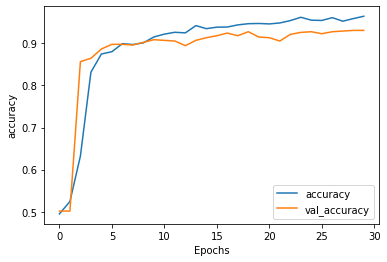

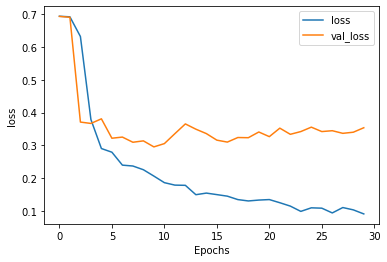

In [16]:
# visualisasi training

def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, 'val_'+string])
  plt.show()
  
plot_graphs(history, "accuracy")
plot_graphs(history, "loss")

# Test the Model

In [18]:
predictions = model.predict(test_padded)
predictions = [1 if p > 0.5 else 0 for p in predictions]


print(test_padded[10:15])

print(f'\nLabel Aktual: {label_test[10:15]}')
print(f'Label Prediksi: {predictions[10:15]}')

[[610 475 102 ...   0   0   0]
 [  5 534   1 ...   0   0   0]
 [ 39 700 343 ...   0   0   0]
 [ 95 186   1 ...   0   0   0]
 [934   1 326 ...   0   0   0]]

Label Aktual: [0 1 1 0 0]
Label Prediksi: [1, 1, 1, 0, 0]


# Kesimpulan
Kalau kalian lihat di atas, bahwa kita memiliki prediksi yang bagus. Kita mengatur untuk **test_padded** dengan index 10 sampai 15 yaitu dimana itu adalah hasil split data test untuk `text` yang sudah di padding.<br/>
maka ketika di outputkan seperti ini:<br/>

[[610 475 102 ...   0   0   0]<br/>
[  5 534   1 ...   0   0   0]<br/>
[ 39 700 343 ...   0   0   0]<br/>
[ 95 186   1 ...   0   0   0]<br/>
[934   1 326 ...   0   0   0]]


Untuk mengetahui label dari **test_padded** index 10-15, kita memanggil **label_test** yang dimana itu adalah label aktual dari **test_padded**. Dan kita mendapati [0 1 1 0 0] sebagai nilai aktual, simpelnya itu adalah label asli dari dataset kita.

Kemudian kita memprediksi hasil dari **test_padded** menggunakan predections, dan di dapati angka [1 1 1 0 0]

Ingat sebelumnya:<br/>
* REAL : 1
* FAKE : 0

Jika kita perhatikan:<br/>
Label Aktual   : [0, 1, 1, 0, 0]<br/>
Label Prediksi : [1, 1, 1, 0, 0]

prediksi kita sebagian besar benar, dan hanya satu yang memiliki kesalahan prediksi, yaitu pada index `10` yang di mana nilai sebenarnya adalah `0(FAKE)` tapi program kita memprediksi itu adalah `1(REAL)`. Tapi tidak apa-apa, karna akurasi yang kita raih sudah cukup bagus sebesar `96%` untuk **akurasi** dan `93%` untuk **akurasi validasi**.

Jadi kalian bisa eksperimen dengan mengganti indexnya dan melihat hasil prediksi dari model kita, jadi itu cara membuat model `NLP` sederhana dengan `Tensorflow`. Terima Kasih!!!
